# EP1 - CALCULO DO CONJUNTO DE MANDELBROT EM PARALELO COM PTHREADS E OPENMP

## Alunos

* Daniel Brasil Magnani - 12630214
* Felipe Martim Fernandes Vieira - 12630242
* Karina de Carvalho Froes - 9297655
* Magali Lemes do Sacramento - 10805420


## Descrição dos experimentos

Foram realizadas 10 medições para cada cenário do programa sequencial. As variações incluíram modificar a imagem gerada e o seu tamanho (uma potência de 2 entre $2^{4}$ e $2^{13}$).

Além dos mesmos experimentos feitos na versão sequencial, também foram realizados experimentos alterando o número de threads (uma potência de 2 entre $2^{0}$ e $2^{5}$). As bibliotecas utilizadas foram Pthreads e OpenMP.

Incluímos também um experimento utilizando a flag do compilador -O3 para os algoritmos sequencial, Pthreads e OMP, porém testamos sem instruções de alocação de memória e I/O.

As visualizações foram criadas com seus devidos intervalos de confiança de 95% segundo a distribuição T Student com 9 graus de liberdade, dado o pequeno valor da amostra coletada para os experimentos.

O computador utilizado para executar os experimentos possui um processador Intel(R) Xeon(R) CPU E5-2670 0 @ 2.60GHz de 32 núcleos, 64GB de memória RAM e sistema operacional Debian 4.19.171-2.

## Análises e gráficos
Para começar a análise dos dados e sua visualização, precisamos importar as bibliotecas conforme comando abaixo:

In [19]:
import Pkg; Pkg.add("CSV"); Pkg.add("DataFrames"); Pkg.add("Gadfly"); Pkg.add("DataFramesMeta")

  Resolving package versions...
   Updating `~/.julia/environments/v1.4/Project.toml`
 [no changes]
   Updating `~/.julia/environments/v1.4/Manifest.toml`
 [no changes]
  Resolving package versions...
   Updating `~/.julia/environments/v1.4/Project.toml`
 [no changes]
   Updating `~/.julia/environments/v1.4/Manifest.toml`
 [no changes]
  Resolving package versions...
   Updating `~/.julia/environments/v1.4/Project.toml`
 [no changes]
   Updating `~/.julia/environments/v1.4/Manifest.toml`
 [no changes]
  Resolving package versions...
   Updating `~/.julia/environments/v1.4/Project.toml`
 [no changes]
   Updating `~/.julia/environments/v1.4/Manifest.toml`
 [no changes]


In [20]:
using CSV
using DataFrames
using DataFramesMeta
using Gadfly
# using CategoricalArrays
set_default_plot_size(21cm, 12cm)

Os resultados dos experimentos se encontram no arquivo results.tsv, que vamos armazenar em um dataframe df.

In [21]:
df = DataFrame(CSV.File("results.tsv", header=1, delim="\t"))
first(df, 5)

,Algorithm,Image,Size,Threads,Time,Stddev,Clock,CPUs
,String,String,Int64,Int64,Float64,Float64,Float64,Float64
1,mandelbrot_seq,elephant.log,16,1,0.001221,4.25e-5,0.87,0.709
2,mandelbrot_seq,elephant.log,32,1,0.00255,0.000221,2.16,0.849
3,mandelbrot_seq,elephant.log,64,1,0.009084,0.000776,8.7,0.958
4,mandelbrot_seq,elephant.log,128,1,0.02641,0.000716,26.04,0.986
5,mandelbrot_seq,elephant.log,256,1,0.09824,0.00904,97.76,0.995


## Análise dos dados 
Vamos começar as análises desconsiderando os dados que estão marcados com a flag de otimização -O3

In [22]:
df = filter(row -> row.O3 == 0, df)
first(df, 5)

,Algorithm,Image,Size,Threads,Time,Stddev,Clock,CPUs
,String,String,Int64,Int64,Float64,Float64,Float64,Float64
1,mandelbrot_seq,elephant.log,16,1,0.001221,4.25e-5,0.87,0.709
2,mandelbrot_seq,elephant.log,32,1,0.00255,0.000221,2.16,0.849
3,mandelbrot_seq,elephant.log,64,1,0.009084,0.000776,8.7,0.958
4,mandelbrot_seq,elephant.log,128,1,0.02641,0.000716,26.04,0.986
5,mandelbrot_seq,elephant.log,256,1,0.09824,0.00904,97.76,0.995


Descrevendo nosso dataset de resultados

Transformando em categóricas algumas colunas que estão como numéricas

In [23]:
df = @linq df |>
    transform(Threads = string.(:Threads)) |>
    transform(IO = string.(:IO)) |>
    transform(MemAlloc = string.(:MemAlloc));

Para responder às primeiras perguntas, utilizaremos os dados sem impacto de alocação de memória e IO.

In [24]:
    df_noio_nomem = @linq df |>
        where(:IO .== "0") |>
        where(:MemAlloc .== "0");

# Como e por que as três versões do programa se comportam com a variação:

## Do tamanho da entrada?

Para analisar o comportamento dos algoritmos em função do tamanho da entrada, vamos fixar os seguintes parâmetros:

* Algoritmos: Sequencial, PThreads e OpenMP
* Região: full
* Threads: 1 a 32
* Tamanho: 16 a 8192
* Sem alocação de memória e I/O

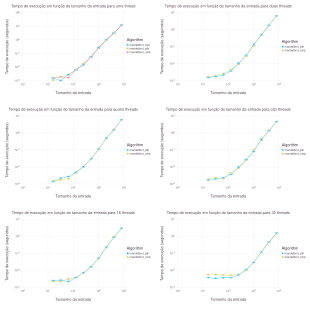

In [25]:
set_default_plot_size(31cm, 31cm)
df_size_one = filter(row -> row.Image == "full.log" && row.Threads == "1", df_noio_nomem)
ymins = df_size_one.Time .- 2.262 * (df_size_one.Stddev / sqrt(9))
ymaxs = df_size_one.Time .+ 2.262 * (df_size_one.Stddev / sqrt(9))
plot_one = plot(df_size_one, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para uma thread"))

df_size_two = filter(row -> row.Image == "full.log" && row.Threads == "2" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
ymins = df_size_two.Time .- 2.262 * (df_size_two.Stddev / sqrt(9))
ymaxs = df_size_two.Time .+ 2.262 * (df_size_two.Stddev / sqrt(9))
plot_two = plot(df_size_two, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para duas threads"))

df_size_three = filter(row -> row.Image == "full.log" && row.Threads == "4" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
ymins = df_size_three.Time .- 2.262 * (df_size_three.Stddev / sqrt(9))
ymaxs = df_size_three.Time .+ 2.262 * (df_size_three.Stddev / sqrt(9))
plot_three = plot(df_size_three, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para quatro threads"))

df_size_four = filter(row -> row.Image == "full.log" && row.Threads == "8" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
ymins = df_size_four.Time .- 2.262 * (df_size_four.Stddev / sqrt(9))
ymaxs = df_size_four.Time .+ 2.262 * (df_size_four.Stddev / sqrt(9))
plot_four = plot(df_size_four, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para oito threads"))

df_size_five = filter(row -> row.Image == "full.log" && row.Threads == "16" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
ymins = df_size_five.Time .- 2.262 * (df_size_five.Stddev / sqrt(9))
ymaxs = df_size_five.Time .+ 2.262 * (df_size_five.Stddev / sqrt(9))
plot_five = plot(df_size_five, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para 16 threads"))

df_size_six = filter(row -> row.Image == "full.log" && row.Threads == "32" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
ymins = df_size_six.Time .- 2.262 * (df_size_six.Stddev / sqrt(9))
ymaxs = df_size_six.Time .+ 2.262 * (df_size_six.Stddev / sqrt(9))
plot_six = plot(df_size_six, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Algorithm,
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Geom.point,
    Geom.line,
    Geom.errorbar,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Tempo de execução em função do tamanho da entrada para 32 threads"))

vstack(hstack(plot_one,plot_two),hstack(plot_three,plot_four),hstack(plot_five, plot_six))

Os gráficos apresentam o tempo de execução em função do tamanho da entrada, utilizando 1, 2, 4, 8, 16 e 32 threads, na região full. Uma entrada de tamanho N produz como resultado de uma imagem de dimensões N x N. Para computar o conjunto de Mandelbrot, realizamos operações para cada pixel da imagem. Portanto, para uma imagem de tamanho N x N, a complexidade do algoritmo é O(N²). Podemos observar esse comportamento no formato dos gráficos, que descrevem uma função quadrática.

No experimento com apenas uma thread os três algoritmos se comportam de forma muito semelhante em relação ao tamanho da entrada, variando no máximo 0.52s, e na média 0.03s. Dos outros cinco gráficos podemos depreender que o número de threads, apesar de reduzir o tempo de execução total, não muda a complexidade do algoritmo, e portanto não altera o formato dos gráficos em relação ao tamanho da entrada.



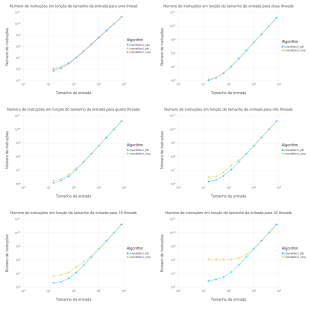

In [26]:
set_default_plot_size(31cm, 31cm)
df_size_one = filter(row -> row.Image == "full.log" && row.Threads == "1", df_noio_nomem)
plot_one = plot(df_size_one, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para uma thread"))

df_size_two = filter(row -> row.Image == "full.log" && row.Threads == "2" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
plot_two = plot(df_size_two, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para duas threads"))

df_size_three = filter(row -> row.Image == "full.log" && row.Threads == "4" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
plot_three = plot(df_size_three, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para quatro threads"))

df_size_four = filter(row -> row.Image == "full.log" && row.Threads == "8" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
plot_four = plot(df_size_four, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para oito threads"))

df_size_five = filter(row -> row.Image == "full.log" && row.Threads == "16" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
plot_five = plot(df_size_five, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para 16 threads"))

df_size_six = filter(row -> row.Image == "full.log" && row.Threads == "32" && row.Algorithm != "mandelbrot_seq", df_noio_nomem)
plot_six = plot(df_size_six, 
    x=:Size,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Número de instruções"),
    color=:Algorithm,
    y=:Instructions,
    Geom.point,
    Geom.line,
    Scale.x_log10,
    Scale.y_log10,
    Guide.title("Número de instruções em função do tamanho da entrada para 32 threads"))

vstack(hstack(plot_one,plot_two),hstack(plot_three,plot_four),hstack(plot_five, plot_six))

Os gráficos acima exibem o número de instruções em função do tamanho da entrada, utilizando 1, 2, 4, 8, 16 e 32 threads, na região full. Da mesma forma que o tempo de execução, o número de instruções cresce quadraticamente à medida que o tamanho da entrada aumenta. Também observamos que, com uma única thread, os algoritmos se comportam igualmente.

Nos gráficos dos experimentos com 16 e 32 threads fica visível a diferença no número de instruções executadas com Pthreads e OpenMP. Isso ocorre pois a biblioteca PThreads é de baixo nível, permitindo um controle mais refinado das instruções executadas, enquanto o OpenMP é um nível de abstração a mais, que pode gerar um código menos otimizado para a situação concreta.

## Das regiões do Conjunto de Mandelbrot?

Veremos o comportamento dos algoritmos em diferentes tamanho de imagem, levando em consideração as diferentes regiões do conjunto de Mandelbrot.

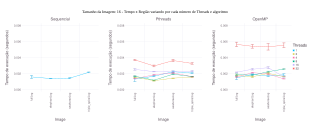

In [27]:
set_default_plot_size(31cm, 13cm)

df_plot = filter(row -> row.Size == 16, df_noio_nomem)

df_plot_seq = filter(row -> row.Algorithm =="mandelbrot_seq", df_plot)
ymins = df_plot_seq.Time .- 2.262 * (df_plot_seq.Stddev / sqrt(9))
ymaxs = df_plot_seq.Time .+ 2.262 * (df_plot_seq.Stddev / sqrt(9))
plot_seq = plot(df_plot_seq,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Sequencial"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_pth = filter(row -> row.Algorithm =="mandelbrot_pth", df_plot)
ymins = df_plot_pth.Time .- 2.262 * (df_plot_pth.Stddev / sqrt(9))
ymaxs = df_plot_pth.Time .+ 2.262 * (df_plot_pth.Stddev / sqrt(9));
plot_pth = plot(df_plot_pth,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Pthreads"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_omp = filter(row -> row.Algorithm =="mandelbrot_omp", df_plot)
ymins = df_plot_omp.Time .- 2.262 * (df_plot_omp.Stddev / sqrt(9))
ymaxs = df_plot_omp.Time .+ 2.262 * (df_plot_omp.Stddev / sqrt(9));
plot_omp = plot(df_plot_omp,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("OpenMP"),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008))

title(hstack(plot_seq, plot_pth, plot_omp), "Tamanho da Imagem: 16 - Tempo x Região variando por cada número de Threads e algoritmo")



Através dos gráficos acima é possível concluir que, para o menor tamanho de imagem, não há muita diferença entre os tempos em regiões diferentes. O interessante é notarmos que quanto mais threads, pior tende a ser o desempenho, dado que o overhead se torna maior que o ganho ao paralelizar o processamento.

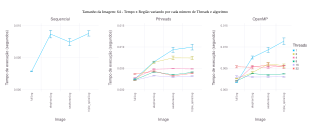

In [28]:
df_plot = filter(row -> row.Size == 64, df_noio_nomem)

df_plot_seq = filter(row -> row.Algorithm =="mandelbrot_seq", df_plot)
ymins = df_plot_seq.Time .- 2.262 * (df_plot_seq.Stddev / sqrt(9))
ymaxs = df_plot_seq.Time .+ 2.262 * (df_plot_seq.Stddev / sqrt(9))
plot_seq = plot(df_plot_seq,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Sequencial"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_pth = filter(row -> row.Algorithm =="mandelbrot_pth", df_plot)
ymins = df_plot_pth.Time .- 2.262 * (df_plot_pth.Stddev / sqrt(9))
ymaxs = df_plot_pth.Time .+ 2.262 * (df_plot_pth.Stddev / sqrt(9))
plot_pth = plot(df_plot_pth,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Pthreads"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_omp = filter(row -> row.Algorithm =="mandelbrot_omp", df_plot)
ymins = df_plot_omp.Time .- 2.262 * (df_plot_omp.Stddev / sqrt(9))
ymaxs = df_plot_omp.Time .+ 2.262 * (df_plot_omp.Stddev / sqrt(9))
plot_omp = plot(df_plot_omp,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("OpenMP"),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008))

title(hstack(plot_seq, plot_pth, plot_omp), "Tamanho da Imagem: 64 - Tempo x Região variando por cada número de Threads e algoritmo")

Com o aumento no tamanho da imagem para 64x64, já é possível analisar uma mudança no comportamento entre diferentes regiões. A região Full possui um tempo menor, enquanto a região Triple Spiral costuma levar mais tempo para processar. Isso se deve à diferença no número de iterações necessários para a convergência em cada região. 

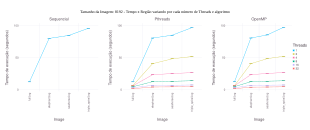

In [29]:
df_plot = filter(row -> row.Size == 8192, df_noio_nomem)

df_plot_seq = filter(row -> row.Algorithm =="mandelbrot_seq", df_plot)
ymins = df_plot_seq.Time .- 2.262 * (df_plot_seq.Stddev / sqrt(9))
ymaxs = df_plot_seq.Time .+ 2.262 * (df_plot_seq.Stddev / sqrt(9))
plot_seq = plot(df_plot_seq,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Sequencial"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_pth = filter(row -> row.Algorithm =="mandelbrot_pth", df_plot)
ymins = df_plot_pth.Time .- 2.262 * (df_plot_pth.Stddev / sqrt(9))
ymaxs = df_plot_pth.Time .+ 2.262 * (df_plot_pth.Stddev / sqrt(9))
plot_pth = plot(df_plot_pth,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Pthreads"),
    Guide.xticks(orientation=:vertical),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008),
    Theme(key_position = :none))

df_plot_omp = filter(row -> row.Algorithm =="mandelbrot_omp", df_plot)
ymins = df_plot_omp.Time .- 2.262 * (df_plot_omp.Stddev / sqrt(9))
ymaxs = df_plot_omp.Time .+ 2.262 * (df_plot_omp.Stddev / sqrt(9))
plot_omp = plot(df_plot_omp,
    x=:Image, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("OpenMP"),
    Scale.x_discrete(order=[2, 1, 3, 4]),
    Scale.y_continuous(minvalue=-0, maxvalue=0.008))

title(hstack(plot_seq, plot_pth, plot_omp), "Tamanho da Imagem: 8192 - Tempo x Região variando por cada número de Threads e algoritmo")

Os gráficos levando em consideração o maior tamanho de imagem só corroboram o comportamento visto anteriormente. O impacto no número de threads fica ainda mais visível.

## Do número de threads?

Aqui iremos utilizar a mesma metodologia gráfica para mostrar o comportamento de cada algoritmo de acordo com o número de threads utilizado.

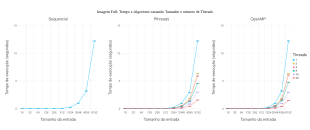

In [30]:
df_plot_full = filter(row -> row.Image == "full.log", df_noio_nomem)

df_plot_seq_full = filter(row -> row.Algorithm =="mandelbrot_seq", df_plot_full)
df_plot_seq_full = @linq df_plot_seq_full |>
              transform(Size = string.(:Size));

ymins = df_plot_seq_full.Time .- 2.262 * (df_plot_seq_full.Stddev / sqrt(9))
ymaxs = df_plot_seq_full.Time .+ 2.262 * (df_plot_seq_full.Stddev / sqrt(9))
plot_seq_full = plot(df_plot_seq_full,
    x=:Size, 
    y=:Time,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    ymin=ymins,
    ymax=ymaxs,
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Sequencial"),
    Theme(key_position = :none))

df_plot_pth_full = filter(row -> row.Algorithm =="mandelbrot_pth", df_plot_full)
df_plot_pth_full = @linq df_plot_pth_full |>
              transform(Size = string.(:Size));

ymins = df_plot_pth_full.Time .- 2.262 * (df_plot_pth_full.Stddev / sqrt(9))
ymaxs = df_plot_pth_full.Time .+ 2.262 * (df_plot_pth_full.Stddev / sqrt(9))
plot_pth_full = plot(df_plot_pth_full,
    x=:Size, 
    y=:Time,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    ymin=ymins,
    ymax=ymaxs,
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Pthreads"),
    Theme(key_position = :none))

df_plot_omp_full = filter(row -> row.Algorithm =="mandelbrot_omp", df_plot_full)
df_plot_omp_full = @linq df_plot_omp_full |>
              transform(Size = string.(:Size));
ymins = df_plot_omp_full.Time .- 2.262 * (df_plot_omp_full.Stddev / sqrt(9))
ymaxs = df_plot_omp_full.Time .+ 2.262 * (df_plot_omp_full.Stddev / sqrt(9))
plot_omp_full = plot(df_plot_omp_full,
    x=:Size, 
    y=:Time,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    ymin=ymins,
    ymax=ymaxs,
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("OpenMP"))

title(hstack(plot_seq_full, plot_pth_full, plot_omp_full), "Imagem Full: Tempo x Algoritmo variando Tamanho e número de Threads")



Através do gráfico acima que mostra como as variações do tamanho das imagens e a quantidade de threads impactam o tempo de execução dos algoritmos na imagem Full, podemos perceber uma relação inversamente proporcional entre threads e tempo.

Ao observamos o comportamento da linha azul que representa uma única thread, percebemos que não há diferença notável entre os três algoritmos, uma vez que com apenas uma thread executamos os algoritmos paralelos de maneira análoga ao sequencial. Da mesma maneira, a criação de um número grande de threads para pequenos tamanhos de entrada também não se mostra muito vantajosa em relação ao programa sequencial. Podemos observar claramente esse efeito ao olharmos o começo do comportamento da linha vermelha representando 32 threads nos algortimos mandelbrot_pth e mandelbrot_omp.

Ademais, apartando essas casos específicos vemos, como já era esperado, que ao aumentarmos o número de threads, mais rápida é a execução do programa e que com o aumento do tamanho de entrada, maior é o tempo. Dessa maneira, para termos um bom desempenho em relação ao tempo de execução, ao aumentarmos o tamanho, precisamos aumentar o número de threads, impacto que fica evidente ao olharmos a parte final dos gráficos: maiores tamanhos com maior número de threads resultam nos menores tempos encontrados.

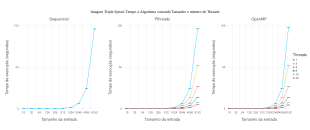

In [31]:
df_plot_triple = filter(row -> row.Image == "triple_spiral.log", df_noio_nomem)

df_plot_seq_triple = filter(row -> row.Algorithm =="mandelbrot_seq", df_plot_triple)
df_plot_seq_triple = @linq df_plot_seq_triple |>
              transform(Size = string.(:Size));

ymins = df_plot_seq_triple.Time .- 2.262 * (df_plot_seq_triple.Stddev / sqrt(9))
ymaxs = df_plot_seq_triple.Time .+ 2.262 * (df_plot_seq_triple.Stddev / sqrt(9));
plot_seq_triple = plot(df_plot_seq_triple,
    x=:Size, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Sequencial"),
    Theme(key_position = :none))

df_plot_pth_triple = filter(row -> row.Algorithm =="mandelbrot_pth", df_plot_triple)
df_plot_pth_triple = @linq df_plot_pth_triple |>
              transform(Size = string.(:Size));

ymins = df_plot_pth_triple.Time .- 2.262 * (df_plot_pth_triple.Stddev / sqrt(9))
ymaxs = df_plot_pth_triple.Time .+ 2.262 * (df_plot_pth_triple.Stddev / sqrt(9));
plot_pth_triple = plot(df_plot_pth_triple,
    x=:Size, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("Pthreads"),
    Theme(key_position = :none))

df_plot_omp_triple = filter(row -> row.Algorithm =="mandelbrot_omp", df_plot_triple)
df_plot_omp_triple = @linq df_plot_omp_triple |>
              transform(Size = string.(:Size));

ymins = df_plot_omp_triple.Time .- 2.262 * (df_plot_omp_triple.Stddev / sqrt(9))
ymaxs = df_plot_omp_triple.Time .+ 2.262 * (df_plot_omp_triple.Stddev / sqrt(9));
plot_omp_triple = plot(df_plot_omp_triple,
    x=:Size, 
    y=:Time,
    ymin=ymins,
    ymax=ymaxs,
    Guide.xlabel("Tamanho da entrada"),
    Guide.ylabel("Tempo de execução (segundos)"),
    color=:Threads,
    Geom.line,
    Geom.errorbar,
    Guide.title("OpenMP"))

title(hstack(plot_seq_triple, plot_pth_triple, plot_omp_triple), "Imagem Triple Spiral: Tempo x Algoritmo variando Tamanho e número de Threads")



Apenas para efeito de visualização, plotamos também o mesmo gráfico para a imagem Triple Spiral que é a região que apresentou maior tempo de execução. Nele podemos ver que os mesmos comportamentos descritos anteriormente ainda valem e que isso é independente da imagem que escolhemos.

# Qual o impacto das operações de I/O e alocação de memória no tempo de execução?

Compararemos o tempo de execução do algoritmo sequencial em cada uma das regiões da imagem nos casos em que ambos I/O e alocação de memória são realizados e nos casos em que nenhuma dessas operações é feita.

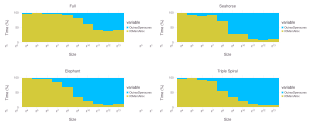

In [32]:
# Data frame com alocação de memória e IO
df_io_mem = @linq df |>
    where(:IO .== "1") |>
    where(:MemAlloc .== "1");

# Filtramos o algoritmo sequencial
df_seq_sem = filter(row -> row.Algorithm == "mandelbrot_seq", df_noio_nomem)
df_seq_io_mem = filter(row -> row.Algorithm == "mandelbrot_seq", df_io_mem)

# Adicionamos colunas com o tempo de alocação de memória e IO
insertcols!(df_seq_io_mem, 6, :AllocIOTime => df_seq_io_mem.Time .- df_seq_sem.Time)
insertcols!(df_seq_io_mem, 6, :Sem => df_seq_sem.Time)

# Colunas com porcentagens do tempo gasto pelas operações
insertcols!(df_seq_io_mem, 6, :OutrasOperacoes => (100 .* df_seq_sem.Time) ./ df_seq_io_mem.Time)
insertcols!(df_seq_io_mem, 6, :IOMemAlloc => (100 .* df_seq_io_mem.AllocIOTime) ./ df_seq_io_mem.Time)

# Renomeanos a coluna Time para Com
rename!(df_seq_io_mem, :Time => :Com)

# Full
df_full_seq = filter(row -> row.Image == "full.log", df_seq_io_mem)
plot_full = plot(stack(df_full_seq, [:OutrasOperacoes, :IOMemAlloc]),
    x=:Size,
    y=:value,
    color=:variable,
    Scale.x_log2,
    Geom.bar,
    Guide.title("Full"),
    Coord.cartesian(xmin=3.5, ymax=100),
    Guide.xticks(ticks=[0:13;]),
    Guide.ylabel("Time (%)"))

# Seahorse
df_sh_seq = filter(row -> row.Image == "seahorse.log", df_seq_io_mem)
plot_seahorse = plot(stack(df_sh_seq, [:OutrasOperacoes, :IOMemAlloc]),
    x=:Size,
    y=:value,
    color=:variable,
    Scale.x_log2,
    Geom.bar,
    Guide.title("Seahorse"),
    Coord.cartesian(xmin=3.5, ymax=100),
    Guide.xticks(ticks=[0:13;]),
    Guide.ylabel("Time (%)"))

# Elephant
df_elephant_seq = filter(row -> row.Image == "elephant.log", df_seq_io_mem)
plot_elephant = plot(stack(df_elephant_seq, [:OutrasOperacoes, :IOMemAlloc]),
    x=:Size,
    y=:value,
    color=:variable,
    Scale.x_log2,
    Geom.bar,
    Guide.title("Elephant"),
    Coord.cartesian(xmin=3.5, ymax=100),
    Guide.xticks(ticks=[0:13;]),
    Guide.ylabel("Time (%)"))

# Triple Spiral
df_ts_seq = filter(row -> row.Image == "triple_spiral.log", df_seq_io_mem)
plot_ts = plot(stack(df_ts_seq, [:OutrasOperacoes, :IOMemAlloc]),
    x=:Size,
    y=:value,
    color=:variable,
    Scale.x_log2,
    Geom.bar,
    Guide.title("Triple Spiral"),
    Coord.cartesian(xmin=3.5, ymax=100),
    Guide.xticks(ticks=[0:13;]),
    Guide.ylabel("Time (%)"))

# Imprimir gráficos
vstack(hstack(plot_full, plot_seahorse), hstack(plot_elephant, plot_ts))

Os gráficos acima mostram, para cada região da imagem, a proporção do tempo consumido pela alocação de memória e pelo I/O em comparação com o tempo gasto por todo o algoritmo.

Observa-se que para tamanhos de imagem pequenos, o tempo gasto pela alocação de memória e por I/O corresponde à maior parte de toda execução do algoritmo. No entanto, com o aumento do tamanho, a alocação de memória e I/O passam a representar uma porcentagem bem menor em relação às outras operações.

Agora, novamente para cada imagem, compararemos o tempo absoluto gasto pelo mesmo algoritmo sequencial nos casos em que há alocação de memória e I/O e nos casos em que não há.

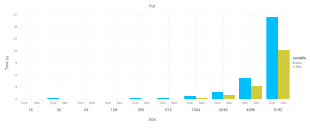

In [33]:
plot(stack(df_full_seq, [:Com, :Sem]),
    xgroup=:Size,
    color=:variable,
    x=:variable,
    y=:value,
    Geom.subplot_grid(Geom.bar, Coord.cartesian(ymax=21)),
    Guide.title("Full"),
    Guide.ylabel("Time (s)"),
    Guide.xlabel("Size"))

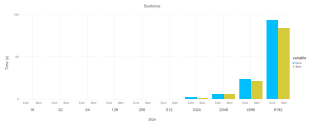

In [34]:
plot(stack(df_sh_seq, [:Com, :Sem]),
    xgroup=:Size,
    color=:variable,
    x=:variable,
    y=:value,
    Geom.subplot_grid(Geom.bar, Coord.cartesian(ymax=100)),
    Guide.title("Seahorse"),
    Guide.ylabel("Time (s)"),
    Guide.xlabel("Size"))

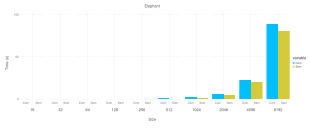

In [35]:
plot(stack(df_elephant_seq, [:Com, :Sem]),
    xgroup=:Size,
    color=:variable,
    x=:variable,
    y=:value,
    Geom.subplot_grid(Geom.bar, Coord.cartesian(ymax=100)),
    Guide.title("Elephant"),
    Guide.ylabel("Time (s)"),
    Guide.xlabel("Size"))

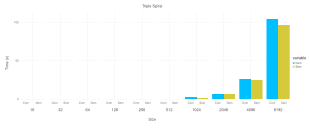

In [36]:
plot(stack(df_ts_seq, [:Com, :Sem]),
    xgroup=:Size,
    color=:variable,
    x=:variable,
    y=:value,
    Geom.subplot_grid(Geom.bar, Coord.cartesian(ymax=110)),
    Guide.title("Triple Spiral"),
    Guide.ylabel("Time (s)"),
    Guide.xlabel("Size"))

A partir de todos os gráficos apresentados, pode-se concluir que o impacto das operações de I/O e alocação de memória é muito mais perceptível em termos percentuais quando o tamanho das imagens é pequeno. Isso ocorre pois, nesse caso, os custos de alocação de memória e escrita de arquivo - mesmo que baixos do ponto de vista absoluto - excedem os das outras operações performadas.

Quando o tamanho das imagens aumenta, há um impacto menor percentualmente - dado que nesse caso o tempo de execução das outras operações supera o tempo para alocar memória e realizar as operações de I/O -, porém maior absolutamente, uma vez que a memória a ser alocada é muito maior e, consequentemente, o arquivo a ser escrito também.

## Conclusões ##

Os experimentos evidenciaram que as bibliotecas PThread e OpenMP podem resultar em ganhos de performance robustos. No entanto, devemos observar caso a caso, pois a paralelização do código gera overhead, e não é vantajosa para pequenos tamanhos de entrada. Também temos que levar em consideração o impacto das operações de alocação de memória e IO, pois elas podem ser um gargalo na performance do algoritmo. A biblioteca OpenMP possui uma facilidade maior de implementação comparada à PThread, porém um menor nível de customização. Desta forma, devemos analisar este custo benefício para cada situação.